In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np
import shutil
np.random.seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

if not os.path.exists('/content/data'):
    os.makedirs('/content/data')

In [ ]:
if not os.path.exists('/content/data/test'):
    os.makedirs('/content/data/test')

if not os.path.exists('/content/data/train'):
    os.makedirs('/content/data/train')

if not os.path.exists('/content/data/valid'):
    os.makedirs('/content/data/valid')

In [ ]:
if not os.path.exists('/content/data/test/images'):
    os.makedirs('/content/data/test/images')

if not os.path.exists('/content/data/test/labels'):
    os.makedirs('/content/data/test/labels')

if not os.path.exists('/content/data/train/images'):
    os.makedirs('/content/data/train/images')

if not os.path.exists('/content/data/train/labels'):
    os.makedirs('/content/data/train/labels')

if not os.path.exists('/content/data/valid/images'):
    os.makedirs('/content/data/valid/images')

if not os.path.exists('/content/data/valid/labels'):
    os.makedirs('/content/data/valid/labels')

In [ ]:

# Set the paths to your images and labels folders in Google Drive
drive_images_path = '/content/drive/Shareddrives/Capstone | Visual identification of persons with limited mobility/Dataset/Images_RGB'
drive_annotations_path = '/content/drive/Shareddrives/Capstone | Visual identification of persons with limited mobility/Dataset/YOLO_ANNOTATIONS'

# Set the paths to your train and val folders in Colab
train_images_path = '/content/data/train/images'
val_images_path = '/content/data/valid/images'
train_annotations_path = '/content/data/train/labels'
val_annotations_path = '/content/data/valid/labels'
test_images_folder_path = '/content/data/test/images'
test_annotations_folder_path = '/content/data/test/labels'

In [ ]:
# Set the train/validation/test split ratio
train_split_ratio = 0.8
val_split_ratio = 0.1
test_split_ratio = 0.1

In [ ]:
# Get the list of files in the images folder
image_files = os.listdir(drive_images_path)

# Remove any images that do not have corresponding annotations
valid_image_files = []
for filename in image_files:
    image_path = os.path.join(drive_images_path, filename)
    annotation_path = os.path.join(drive_annotations_path, os.path.splitext(filename)[0] + '.txt')
    if os.path.exists(annotation_path):
        valid_image_files.append(filename)

In [ ]:
random.shuffle(valid_image_files)

In [ ]:
len(valid_image_files)

15251

In [ ]:
valid_image_files = valid_image_files[:1500]

In [ ]:
len(valid_image_files)

1500

In [ ]:
8# Split the files into train, val and test sets
num_train_files = int(train_split_ratio * len(valid_image_files))
num_val_files = int(val_split_ratio * len(valid_image_files))
num_test_files = len(valid_image_files) - num_train_files - num_val_files

In [ ]:
train_image_files = valid_image_files[:num_train_files]
val_image_files = valid_image_files[num_train_files:num_train_files+num_val_files]
test_image_files = valid_image_files[num_train_files+num_val_files:]

In [ ]:
# Copy the train images and annotations to the train folder
for filename in train_image_files:
    image_src = os.path.join(drive_images_path, filename)
    annotation_src = os.path.join(drive_annotations_path, os.path.splitext(filename)[0] + '.txt')
    shutil.copy(image_src, train_images_path)
    shutil.copy(annotation_src, train_annotations_path)



In [ ]:
# Copy the val images and annotations to the val folder
for filename in val_image_files:
    image_src = os.path.join(drive_images_path, filename)
    annotation_src = os.path.join(drive_annotations_path, os.path.splitext(filename)[0] + '.txt')
    shutil.copy(image_src, val_images_path)
    shutil.copy(annotation_src, val_annotations_path)



In [ ]:
# Copy the test images and annotations to the test folder
for filename in test_image_files:
    image_src = os.path.join(drive_images_path, filename)
    annotation_src = os.path.join(drive_annotations_path, os.path.splitext(filename)[0] + '.txt')
    shutil.copy(image_src, test_images_folder_path)
    shutil.copy(annotation_src, test_annotations_folder_path)

Hyperparameters

In [ ]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 50

Visualization

In [ ]:
class_names = ['person', 'crutches', 'wheelchair', 'walking_frame', 'push_wheelchair']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    img = []
    num_images = len(all_training_images)
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        img.append(all_training_images[j])
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()
    print(img)

In [ ]:
!ls

data  drive  sample_data


In [ ]:
%cd content

[Errno 2] No such file or directory: 'content'
/content


In [ ]:
%cd data

/content/data


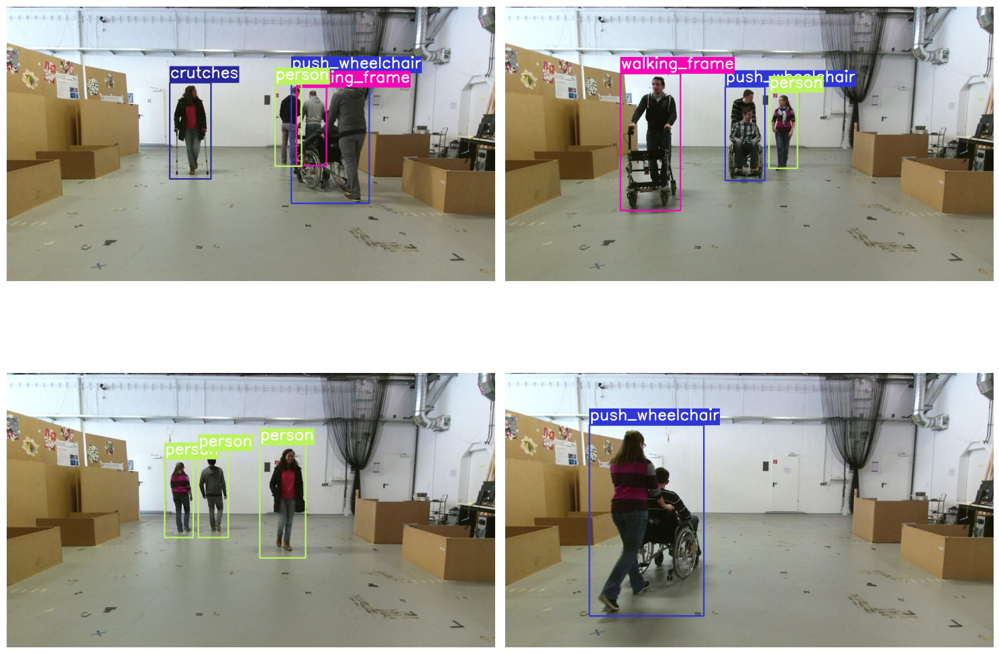

['train/images/seq_1477472845.3400903840.png', 'train/images/seq_1477472170.6086971640.png', 'train/images/seq_1477473500.5845722280.png', 'train/images/seq_1477472291.5793735100.png']


In [ ]:
# Visualize a few training images.
plot(
    image_paths='train/images/*', 
    label_paths='train/labels/*',
    num_samples=4,
)

## Helper Functions

In [ ]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [ ]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

## Clone YOLOV5 Repository

In [ ]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 15598, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (151/151), done.
remote: Total 15598 (delta 98), reused 115 (delta 54), pack-reused 15393
Receiving objects: 100% (15598/15598), 14.64 MiB | 14.78 MiB/s, done.
Resolving deltas: 100% (10626/10626), done.


In [ ]:
%cd yolov5/
!pwd

/content/data/yolov5
/content/data/yolov5


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00


## Training using YOLOV5

In [ ]:
monitor_tensorboard()

<IPython.core.display.Javascript object>

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/data/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-155-g8ecc727 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, 

## Check Out the Validation Predictions and Inference

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [ ]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [ ]:
def visualize(INFER_DIR):
    # Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.png")
    num_images = len(infer_images)
    rows = 3
    cols = 3
    fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
    axes = axes.ravel()
    for i, pred_image in enumerate(infer_images):
        if i == rows*cols:
            break
        image = cv2.imread(pred_image)
        axes[i].imshow(image[:, :, ::-1])
        axes[i].axis('off')
    plt.subplots_adjust(wspace=0, hspace= -1)
    plt.show()

confusion_matrix.png				     results.png
events.out.tfevents.1682592068.65e894bfc85e.11371.0  train_batch0.jpg
F1_curve.png					     train_batch1.jpg
hyp.yaml					     train_batch2.jpg
labels_correlogram.jpg				     val_batch0_labels.jpg
labels.jpg					     val_batch0_pred.jpg
opt.yaml					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights
['runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch2_pred.jpg']


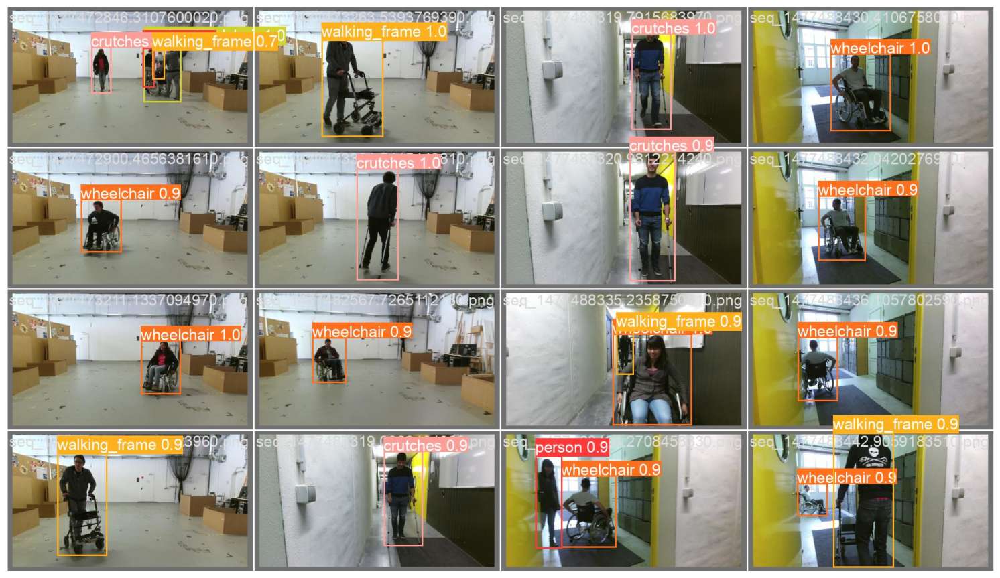

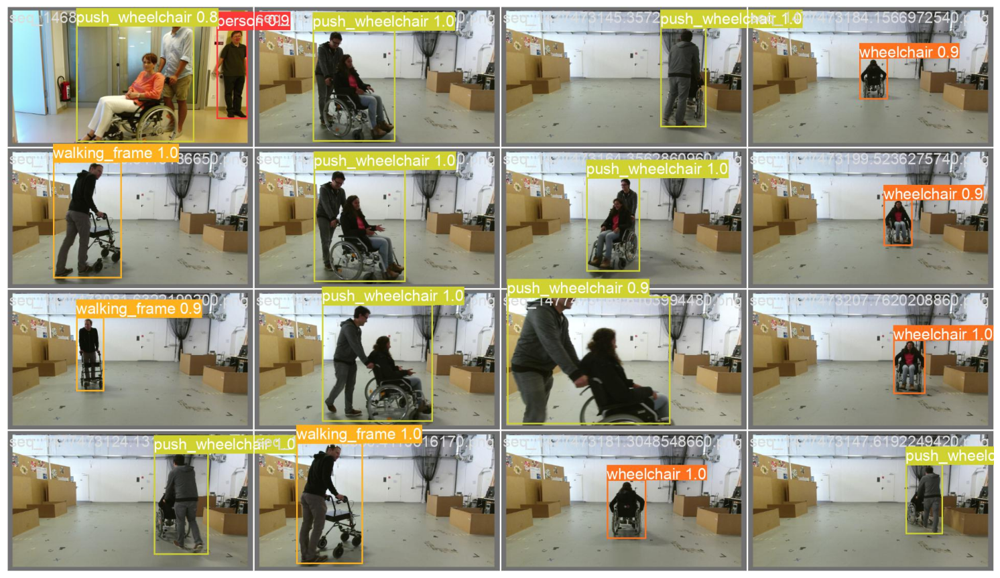

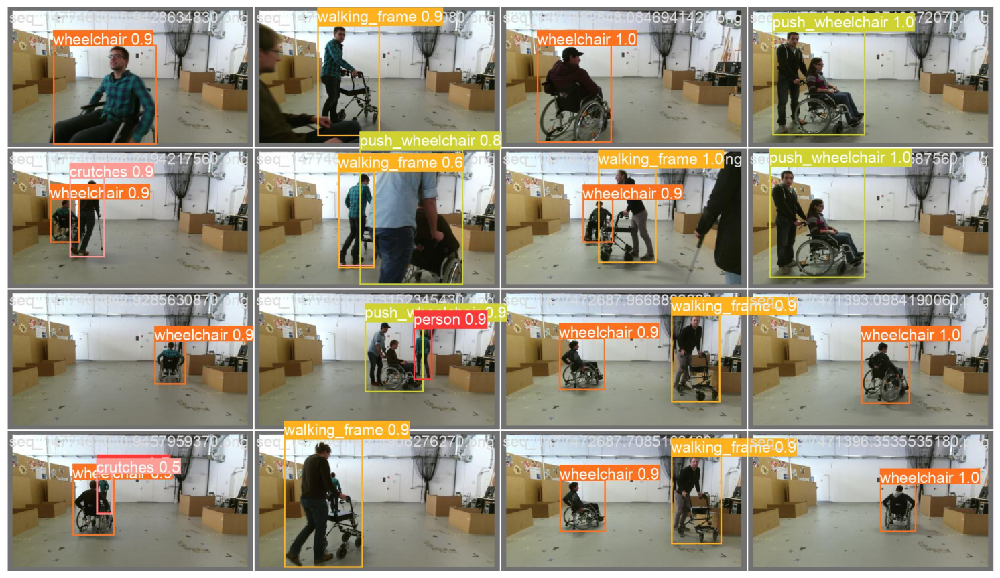

In [ ]:
show_valid_results(RES_DIR)

## Inference
In this section, we will carry out inference on unseen images and videos from the internet

In [ ]:
IMAGE_INFER_DIR = inference(RES_DIR,'../test/images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/data/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-155-g8ecc727 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/150 /content/data/test/images/seq_1468843390.3674622450.png: 384x640 1 wheelchair, 1 push_wheelchair, 39.6ms
image 2/150 /content/data/test/images/seq_1468843521.9413825420.png: 384x640 3 persons

In [ ]:
!ls

In [ ]:
!ls

In [ ]:
visualize('inference_1')

In [ ]:
IMAGE_INFER_DIR = inference(RES_DIR,'../test/My_img')

In [ ]:
visualize(IMAGE_INFER_DIR)

[]


## Training and Inference using  Medium Model

> Indented block

In [ ]:
%reload_ext tensorboard

In [ ]:
monitor_tensorboard()

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_2
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/data/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-155-g8ecc727 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, 

In [ ]:
IMAGE_INFER_DIR = inference(RES_DIR,'../test/images')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_2/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/data/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-155-g8ecc727 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
image 1/150 /content/data/test/images/seq_1468843390.3674622450.png: 384x640 1 wheelchair, 69.9ms
image 2/150 /content/data/test/images/seq_1468843521.9413825420.png: 384x640 3 persons, 19.9ms
image 3/1

IndexError: ignored

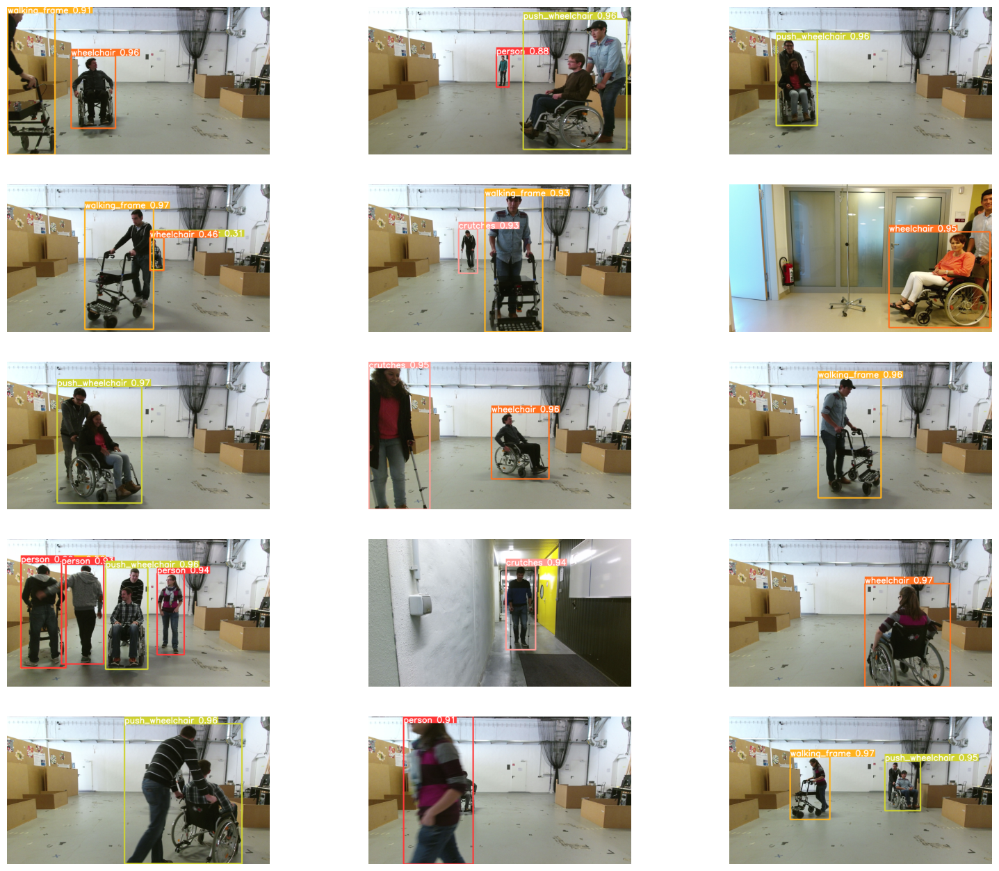

In [ ]:
visualize(IMAGE_INFER_DIR)

In [ ]:
!ls

benchmarks.py	 detect.py   __pycache__       segment	       val.py
CITATION.cff	 export.py   README.md	       setup.cfg       yolov5m.pt
classify	 hubconf.py  README.zh-CN.md   train.py        yolov5s.pt
CONTRIBUTING.md  LICENSE     requirements.txt  tutorial.ipynb
data		 models      runs	       utils


In [ ]:
%cd runs

/content/data/yolov5/runs


In [ ]:
%cd detect

/content/data/yolov5/runs/detect


In [ ]:
!zip -r inference_1.zip inference_1

  adding: inference_1/ (stored 0%)
  adding: inference_1/seq_1468843801.2636430890.png (deflated 4%)
  adding: inference_1/seq_1477473042.1574938800.png (deflated 3%)
  adding: inference_1/seq_1477487253.7320707030.png (deflated 3%)
  adding: inference_1/seq_1477471884.3727812910.png (deflated 3%)
  adding: inference_1/seq_1477473304.9902010860.png (deflated 3%)
  adding: inference_1/seq_1477473181.2388736940.png (deflated 3%)
  adding: inference_1/seq_1477471954.7449365000.png (deflated 3%)
  adding: inference_1/seq_1477488467.7730764160.png (deflated 2%)
  adding: inference_1/seq_1477303028.5272992740.png (deflated 3%)
  adding: inference_1/seq_1477488420.9730172450.png (deflated 4%)
  adding: inference_1/seq_1477473129.7172679020.png (deflated 3%)
  adding: inference_1/seq_1477488505.2423709210.png (deflated 2%)
  adding: inference_1/seq_1477471402.6339331610.png (deflated 3%)
  adding: inference_1/seq_1477471404.3670142850.png (deflated 3%)
  adding: inference_1/seq_1477482548.5592

In [ ]:
from google.colab import files
files.download("inference_1.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r inference_3.zip inference_3

  adding: inference_3/ (stored 0%)
  adding: inference_3/seq_1468843801.2636430890.png (deflated 4%)
  adding: inference_3/seq_1477473042.1574938800.png (deflated 3%)
  adding: inference_3/seq_1477487253.7320707030.png (deflated 3%)
  adding: inference_3/seq_1477471884.3727812910.png (deflated 3%)
  adding: inference_3/seq_1477473304.9902010860.png (deflated 3%)
  adding: inference_3/seq_1477473181.2388736940.png (deflated 3%)
  adding: inference_3/seq_1477471954.7449365000.png (deflated 3%)
  adding: inference_3/seq_1477488467.7730764160.png (deflated 2%)
  adding: inference_3/seq_1477303028.5272992740.png (deflated 3%)
  adding: inference_3/seq_1477488420.9730172450.png (deflated 4%)
  adding: inference_3/seq_1477473129.7172679020.png (deflated 3%)
  adding: inference_3/seq_1477488505.2423709210.png (deflated 2%)
  adding: inference_3/seq_1477471402.6339331610.png (deflated 3%)
  adding: inference_3/seq_1477471404.3670142850.png (deflated 3%)
  adding: inference_3/seq_1477482548.5592

In [ ]:
from google.colab import files
files.download("inference_3.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>